# Analyze and visualize control model outputs with python using Jupyter notebooks

## Questions

- How to start/stop Jupyter notebooks in the Jupyterhub?
- How to analyze and visualize CESM outputs with python?
- What is the vertical coordinate in CESM?

## Objectives
- Learn about the Jupyter ecosystem
- Learn to analyze CESM CAM outputs with the test run
- Learn about python packages for Earth System Modelling

# Post-processing and Visualization

### Open data catalog for analyzing F200climo f19_g17 control experiment (atmosphere only)

- We use intake python package to load our data catalog
- We use xarray and dask for loading and visualizing data stored on owncloud.

In [26]:
import xarray as xr
xr.set_options(display_style='html')
import intake
intake.output_notebook()
%matplotlib inline

cat = intake.open_catalog('F2000climo_f19_g17_control.yaml')

#### List content of data catalog

In [19]:
list(cat)

['F2000climo_f19_g17_control']

#### Select and discover metadata

In [20]:
data = cat.F2000climo_f19_g17_control
data.discover()

{'datashape': None,
 'dtype': None,
 'shape': None,
 'npartitions': None,
 'metadata': {'catalog_dir': '/data/dnb02/galaxy_db/job_working_directory/008/703/8703406/working/jupyter/',
  'dims': {'ilev': 33,
   'lat': 96,
   'lev': 32,
   'lon': 144,
   'nbnd': 2,
   'time': 156},
  'data_vars': {'ADRAIN': ['lat', 'lev', 'lon', 'time'],
   'ADSNOW': ['lat', 'lev', 'lon', 'time'],
   'AEROD_v': ['lat', 'lon', 'time'],
   'ANRAIN': ['lat', 'lev', 'lon', 'time'],
   'ANSNOW': ['lat', 'lev', 'lon', 'time'],
   'AODDUST': ['lat', 'lon', 'time'],
   'AODDUST1': ['lat', 'lon', 'time'],
   'AODDUST3': ['lat', 'lon', 'time'],
   'AODVIS': ['lat', 'lon', 'time'],
   'AQRAIN': ['lat', 'lev', 'lon', 'time'],
   'AQSNOW': ['lat', 'lev', 'lon', 'time'],
   'AREI': ['lat', 'lev', 'lon', 'time'],
   'AREL': ['lat', 'lev', 'lon', 'time'],
   'AWNC': ['lat', 'lev', 'lon', 'time'],
   'AWNI': ['lat', 'lev', 'lon', 'time'],
   'CCN3': ['lat', 'lev', 'lon', 'time'],
   'CDNUMC': ['lat', 'lon', 'time'],
   'C

#### Use dask & xarray to manipulate data

In [21]:
df = data.to_dask()

In [22]:
df

,Array,Chunk
Bytes,276.04 MB,1.77 MB
Shape,"(156, 32, 96, 144)","(1, 32, 96, 144)"
Count,157 Tasks,156 Chunks
Type,float32,numpy.ndarray
,Array,Chunk
Bytes,276.04 MB,1.77 MB
Shape,"(156, 32, 96, 144)","(1, 32, 96, 144)"
Count,157 Tasks,156 Chunks
Type,float32,numpy.ndarray
,Array,Chunk


### Map visualization with xarray

- Now we can create a map. We want to plot TS (Surface temperature) using the xarray.DataArray.plot() function:

In [23]:
df.TS

,Array,Chunk
Bytes,8.63 MB,55.30 kB
Shape,"(156, 96, 144)","(1, 96, 144)"
Count,157 Tasks,156 Chunks
Type,float32,numpy.ndarray


#### select first time 0001-02-01 00:00:00 using isel and plot

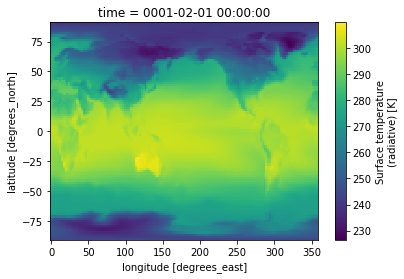

In [27]:
df.TS.isel(time=0).plot()

## Customize your maps

### Set figure size

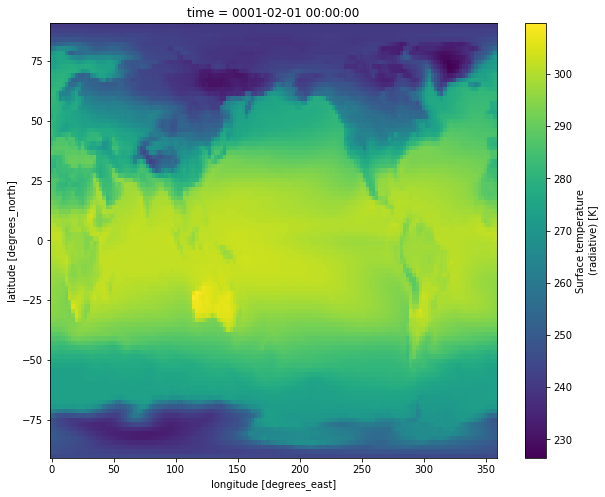

In [29]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [10., 8.]
df.TS.isel(time=0).plot()

# Getting help

In [30]:
help(mpl)

Help on package matplotlib:

NAME
    matplotlib - This is an object-oriented plotting library.

DESCRIPTION
    A procedural interface is provided by the companion pyplot module,
    which may be imported directly, e.g.::
    
        import matplotlib.pyplot as plt
    
    or using ipython::
    
        ipython
    
    at your terminal, followed by::
    
        In [1]: %matplotlib
        In [2]: import matplotlib.pyplot as plt
    
    at the ipython shell prompt.
    
    For the most part, direct use of the object-oriented library is
    encouraged when programming; pyplot is primarily for working
    interactively.  The
    exceptions are the pyplot commands :func:`~matplotlib.pyplot.figure`,
    :func:`~matplotlib.pyplot.subplot`,
    :func:`~matplotlib.pyplot.subplots`, and
    :func:`~pyplot.savefig`, which can greatly simplify scripting.
    
    Modules include:
    
        :mod:`matplotlib.axes`
            defines the :class:`~matplotlib.axes.Axes` class.  Most pylab

## Change colormap

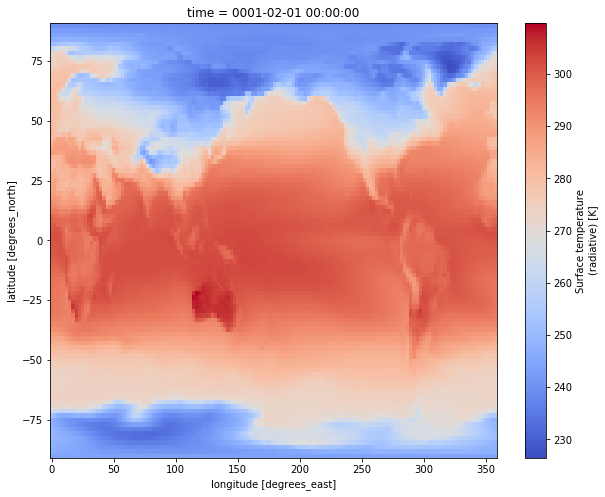

In [31]:
df.TS.isel(time=0).plot(cmap='coolwarm')

# Plot 4D-fields such as Temperature

- In the same way add another cell below the plot and display the variable T instead of the surface temperature (TS). To select which vertical level to plot use the isel() function. Here we select lev=20.

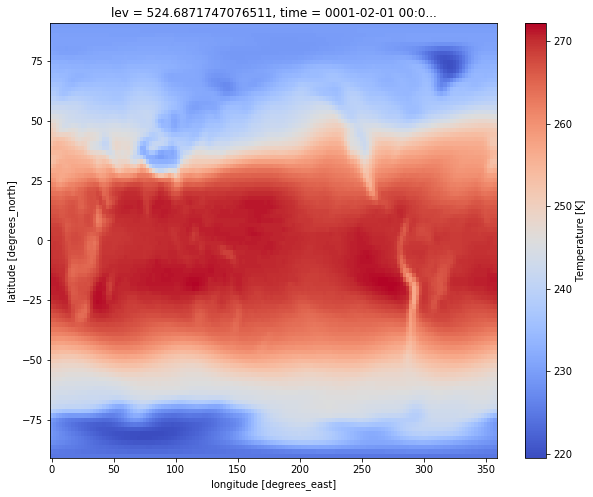

In [33]:
df.T.isel(time=0, lev=20).plot(cmap='coolwarm')

- Contrary to TS which depends only on two horizontal dimensions (namely latitude and longitude) plus time, for T there is an additional vertical dimension (lev).

Now, add another cell below the plot and try to display the zonal wind (U) instead of the surface temperature (TS). As for T, U has an additional dimension (along the vertical), hence we also have to specify a vertical level (between 0 and 29) to make our plot.

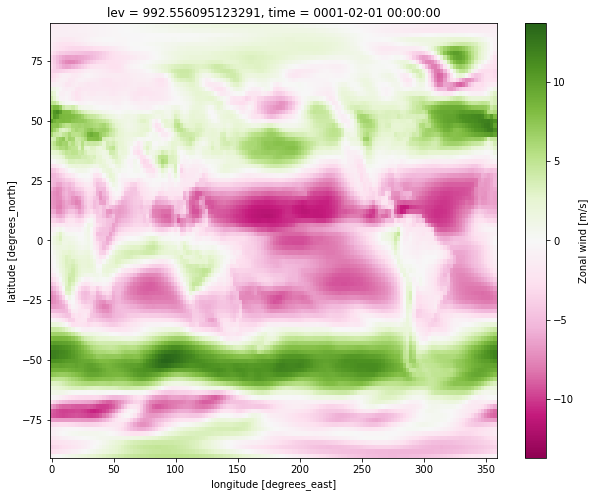

In [34]:
df.U.isel(time=0, lev=-1).plot(cmap='PiYG')

# Change map projection

We can use the Python package Cartopy to produce maps and do other geospatial data analyses.

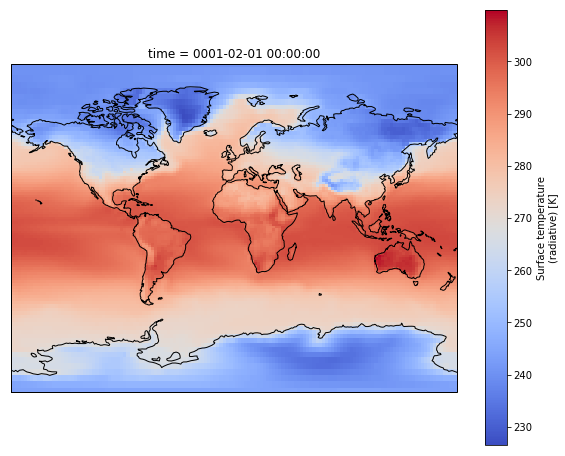

In [36]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure()
ax = plt.axes(projection=ccrs.Miller())

df.TS.isel(time=0).plot(ax=ax, 
           transform=ccrs.PlateCarree(),
           cmap='coolwarm'
          )

ax.coastlines()

## Adding lat/lon labels when using projections
As you can see on the figure above, axes labels disappear when you change the map projection. 

You can add gridlines:

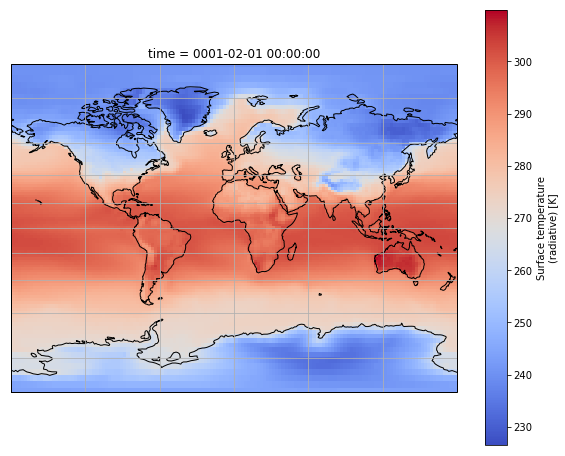

In [40]:
fig = plt.figure()
ax = plt.axes(projection=ccrs.Miller())

df.TS.isel(time=0).plot(ax=ax, 
           transform=ccrs.PlateCarree(),
           cmap='coolwarm'
          )

ax.coastlines()
ax.gridlines()

## Change projection

- On recent version of cartopy (>= 0.18.0b1), [support for lat/lon labelling has been added for all projections](https://github.com/SciTools/cartopy/pull/1117).
- On older versions of cartopy, PlateCarree and Mercator projections support lat/lon labelling:

Text(0.5,1.08,'Surface temperature')

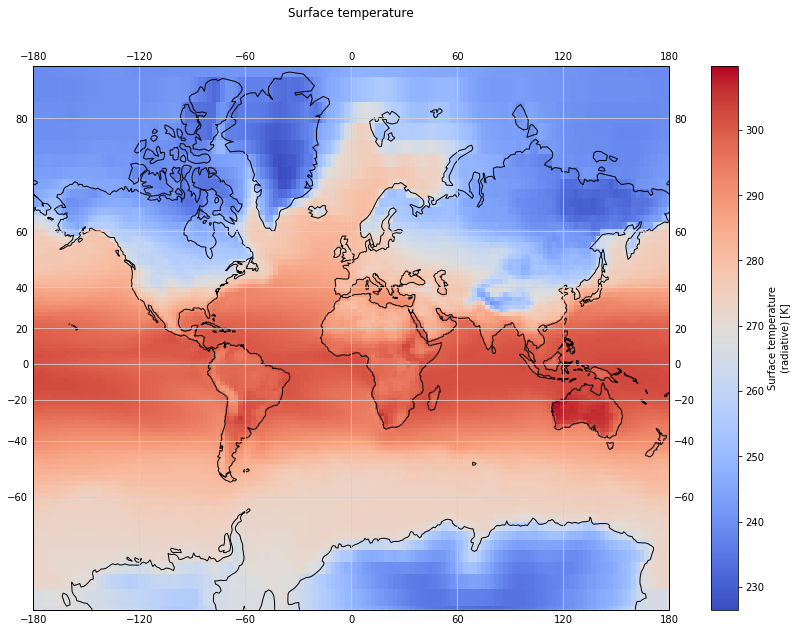

In [42]:
fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.Mercator())

df.TS.isel(time=0).plot(ax=ax, 
           transform=ccrs.PlateCarree(),
           cmap='coolwarm'
          )

ax.coastlines()
ax.gridlines(color='lightgrey', linestyle='-', draw_labels=True)

# to make sure the title does not oveelap longitude labelling
plt.title("Surface temperature", y=1.08)

The list of available cartopy projections is available [here](https://scitools.org.uk/cartopy/docs/latest/crs/projections.html).

## Select time

- so far we have used isel(time=0) to select time. We can lso explicitly use a date. Here our simulation started from year 1 (from 2000 climatology conditions).
- we use a python package called cftime (CF convention time)

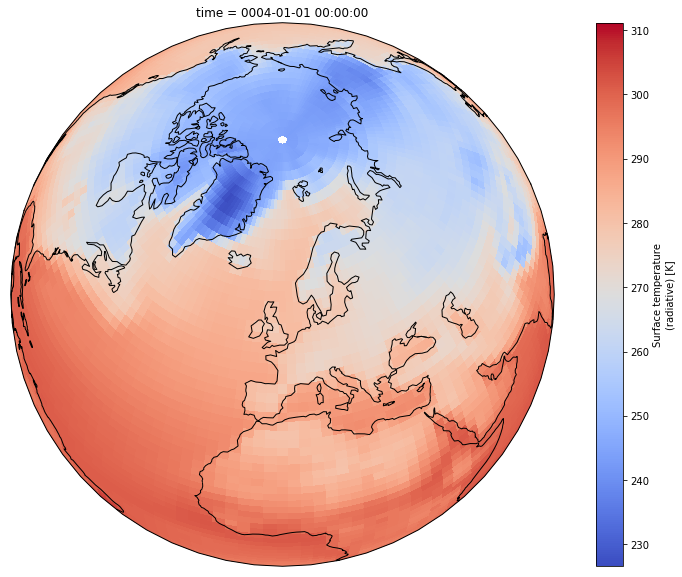

In [53]:
import cftime

fig = plt.figure(figsize=(15,10))
ax = plt.axes(projection=ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=60.0))

df.TS.sel(time=cftime.DatetimeNoLeap(4, 1, 1), method='nearest').plot(ax=ax, 
           transform=ccrs.PlateCarree(),
           cmap='coolwarm'
          )

ax.coastlines()

# Exercise

- Generate maps for various variables such as T, U and any other variables that may be of interest for your analysis. 

# Multiplots 
## Faceting

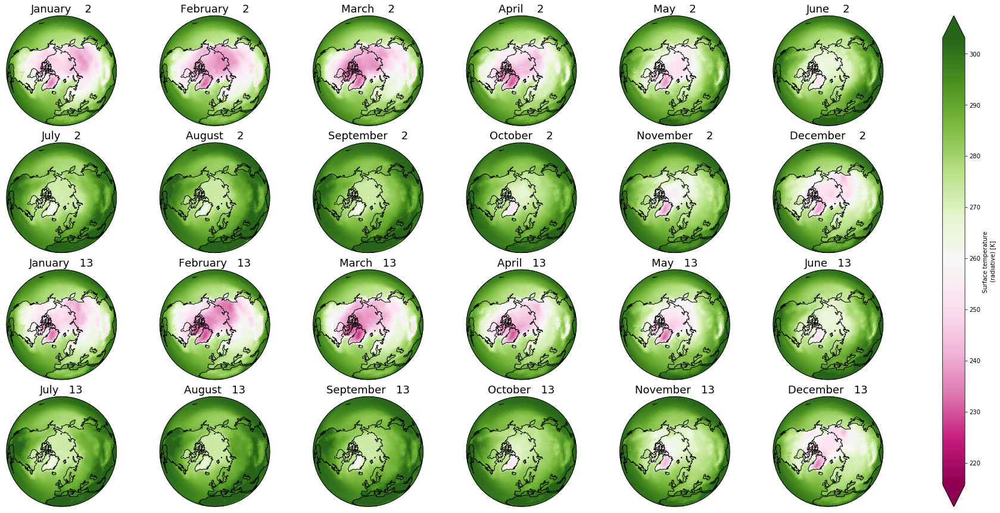

In [87]:
proj_plot = ccrs.Orthographic(0, 90)

p = df['TS'].sel(time = df.time.dt.year.isin([2, 13])).plot(x='lon', y='lat', 
                                                                 transform=ccrs.PlateCarree(),
                                                                 aspect=df.dims["lon"] / df.dims["lat"],  # for a sensible figsize
                                                                 subplot_kws={"projection": proj_plot},
                                                                 col='time', col_wrap=6, robust=True, cmap='PiYG')
# We have to set the map's options on all four axes
for ax,i in zip(p.axes.flat,  df.time.sel(time = df.time.dt.year.isin([2, 13])).values):
    ax.coastlines()
    ax.set_title(i.strftime("%B %Y"), fontsize=18)

# Georeferenced Latitude-Vertical plot

## 2D plot for one longitude point

- We use xarray’s sel to select the data along longitude 0.

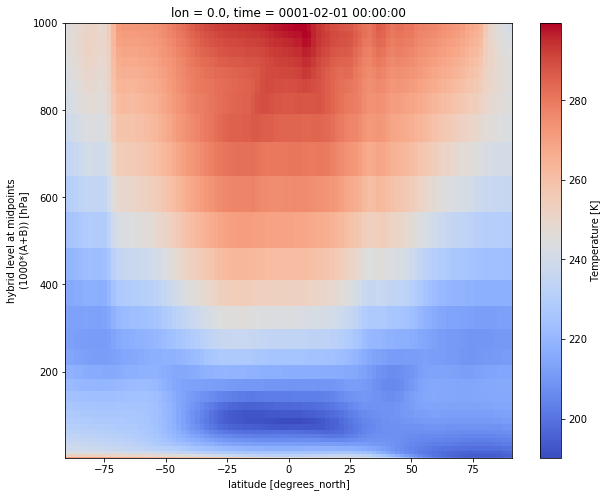

In [59]:
df.T.isel(time=0).sel(lon=0).plot(cmap='coolwarm')

# 2D plot over averaged longitudes
Now instead of selecting one longitude, we average over all the longitudes, using the mean function:


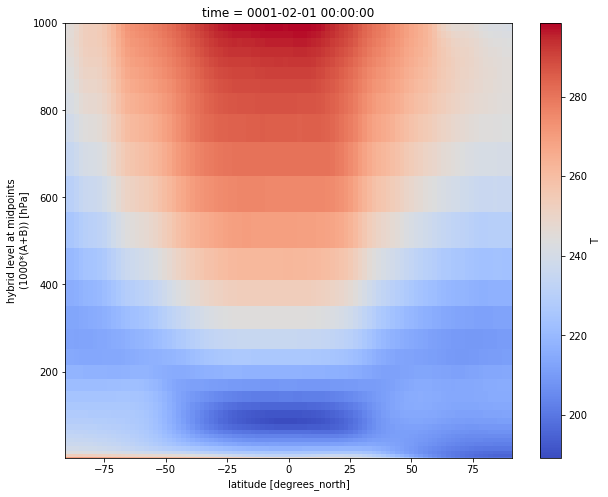

In [61]:
df.T.isel(time=0).mean(dim='lon').plot(cmap='coolwarm')

## CESM vertical coordinate system

The vertical coordinate is a **hybrid sigma-pressure system**. 

The hybrid coordinate was developed by 
[Simmons and Strüfing, 1981](https://rmets.onlinelibrary.wiley.com/doi/abs/10.1002/qj.49710945905) 
in order to provide a general framework for a vertical coordinate which is terrain following at 
the Earth’s surface, but reduces to a pressure coordinate at some point above the surface.

In this system, the upper regions 
of the atmosphere are discretized by pressure only. Lower vertical levels use 
the sigma (i.e. p/ps) vertical coordinate smoothly merged in, with the lowest levels being 
pure sigma. A schematic representation of the hybrid vertical coordinate and vertical indexing is 
presented below. 

<img src="https://nordicesmhub.github.io/GEO4962/fig/hybrid_sigma_pressure_coordinates.png" height="400">

The CESM system is defined such that closer to the earth's surface, the levels more closely resemble a pure sigma level, while the higher up you go, the more the levels are like pressure levels.

The formula to use to determine the pressure at the edge of the layer K is : 

<img src="https://nordicesmhub.github.io/GEO4962/fig/sigma_levels.png" width="220">

where Ps is the surface pressure and A and B are coefficients defined at each model level and stored in the netCDF model outputs.

Let's have a look at the values of A and B:


In [66]:
print(df.isel(time=0).hyam.values)

[0.00364347 0.00759482 0.01435663 0.02461222 0.03592325 0.04319375
 0.0516775  0.0615205  0.07375096 0.08782123 0.10331713 0.12154724
 0.14299404 0.16822508 0.17823067 0.17032433 0.16102291 0.15008029
 0.13720686 0.12206194 0.10424471 0.08497915 0.0665017  0.05019679
 0.03718866 0.02843195 0.02220898 0.01640738 0.01107456 0.00625495
 0.00198941 0.        ]


In [67]:
print(df.isel(time=0).hybm.values)

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01967741 0.06250429 0.11288791 0.17216162
 0.24189404 0.32393064 0.42044246 0.52479954 0.62488773 0.71320769
 0.78366971 0.83110282 0.86481127 0.89623716 0.92512384 0.95123053
 0.974336   0.9925561 ]


If we print these coefficients A and B and the level, we can clearly understand why at the top of the atmosphere, we have pure pressure levels (B=0) and pure sigma levels at the bottom (A=0):

In [69]:
print("lev     A          B")
for lev, a, b in zip (range(1,df.isel(time=0).dims['lev']+1), df.isel(time=0).hyam.values, df.isel(time=0).hybm.values):
    print(lev, 1000*a, 1000*b)

lev     A          B
1 3.64346569404006 0.0
2 7.594819646328688 0.0
3 14.356632251292467 0.0
4 24.612220004200935 0.0
5 35.92325001955032 0.0
6 43.1937500834465 0.0
7 51.67749896645546 0.0
8 61.52049824595451 0.0
9 73.75095784664154 0.0
10 87.82123029232025 0.0
11 103.31712663173676 0.0
12 121.54724076390266 0.0
13 142.99403876066208 0.0
14 168.22507977485657 0.0
15 178.2306730747223 19.677413627505302
16 170.32432556152344 62.50429339706898
17 161.02290898561478 112.8879077732563
18 150.08028596639633 172.16161638498306
19 137.20685988664627 241.89404398202896
20 122.06193804740906 323.93063604831696
21 104.24471274018288 420.44246196746826
22 84.97915416955948 524.7995406389236
23 66.50169566273689 624.8877346515656
24 50.19678920507431 713.2076919078827
25 37.188658490777016 783.6697101593018
26 28.431948274374008 831.1028182506561
27 22.20897749066353 864.8112714290619
28 16.40738220885396 896.2371647357941
29 11.074557900428772 925.1238405704498
30 6.2549535650759935 951.230525970

We multiplied A and B by 1000 so that values are in hPa.

So if we compute the pressure at the lowest model level in Oslo:

In [71]:
# Find the surface pressure of the grid cell near Oslo and convert from Pascal to hPa
PS_oslo = df['PS'].isel(time=0).sel(lat=60., lon=10.75, method='nearest')/100. 

# Convert the lowest model level from sigma to pressure
p_bottom_oslo = df.isel(time=0).hyam[-1] + df.isel(time=0).hybm[-1]*PS_oslo
print("Oslo (hPa)")
print("PS = ", PS_oslo.values, " Lowest model level = ", p_bottom_oslo.values)

Oslo (hPa)
PS =  949.5552  Lowest model level =  942.4867773775477


So the pressure at the lowest model level is not that far from the surface pressure in Oslo.

# Exercise

Compute the pressure value at the lowest model level (close to the surface) for lat=28 and lon=86.5 (Everest top)

More information can be found in [Description of the NCAR Community Atmosphere Model (CAM)](http://www.cesm.ucar.edu/models/atm-cam/docs/description/description.pdf).

Having pressure values (hPa) as the vertical coordinate, it is clear that we need to revert the vertical axis to get the lower values at the top and the highest values at the bottom:

(1000.6714389892295, 1.6677887178957462)

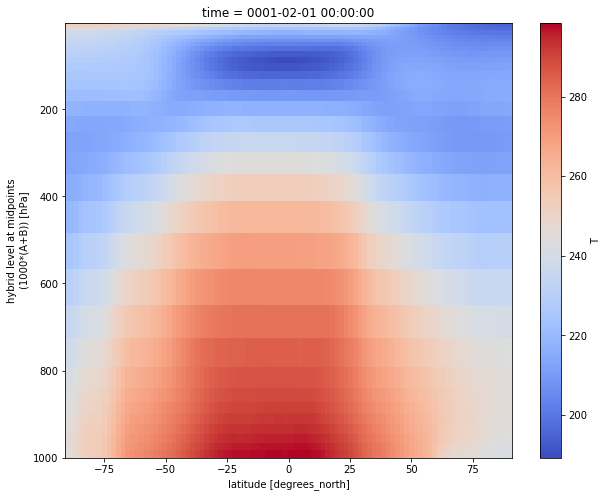

In [74]:
df.T.isel(time=0).mean(dim='lon').plot(cmap='coolwarm')
plt.ylim(plt.ylim()[::-1])

The vertical axis is labelled as “hybrid level at midpoints”. Again, not pressure levels but still we usually use the log to plot it as it is more intuitive to analyze. For this, go to the tab “Grid” and change the units of the vertical axis from “scalar” to “Log10”.

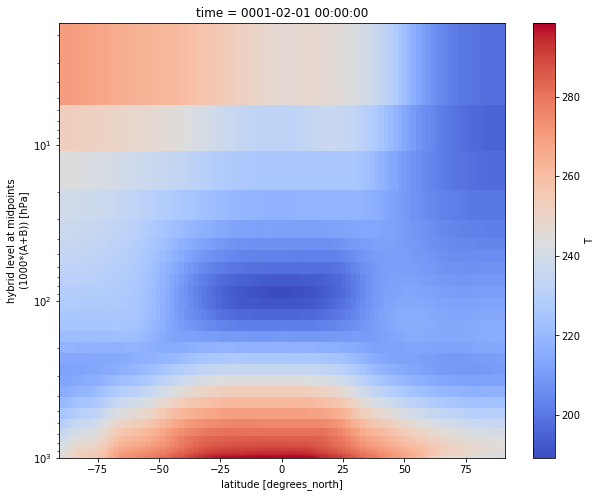

In [76]:
df.T.isel(time=0).mean(dim='lon').plot(cmap='coolwarm')
plt.ylim(plt.ylim()[::-1])
plt.yscale('log')

We can also adjust the top of the figure:

(1000.6714389892295, 10)

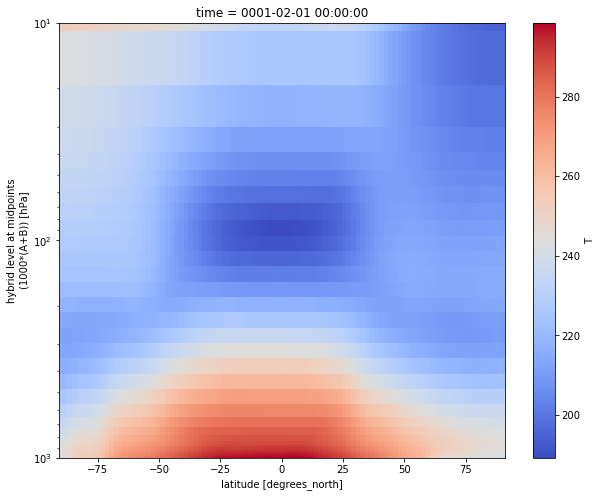

In [77]:
df.T.isel(time=0).mean(dim='lon').plot(cmap='coolwarm')
plt.ylim(plt.ylim()[::-1])
plt.yscale('log')
plt.ylim(top=10)